In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

  Using cached https://files.pythonhosted.org/packages/61/29/fc60b2de1713aa92946992544329f20ccb5e4ba26290f403e04b7da44105/opencv_contrib_python-3.4.2.17-cp36-cp36m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/03/27/e35e7c6e6a52fab9fcc64fc2b20c6b516eba930bb02b10ace3b38200d3ab/numpy-1.18.4-cp36-cp36m-manylinux1_x86_64.whl
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.18.4
    Uninstalling numpy-1.18.4:
      Successfully uninstalled numpy-1.18.4
  Found existing installation: opencv-contrib-python 3.4.2.17
    Unins

In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import plotly
from skimage import io
from skimage import morphology as morp
import plotly.express as px
import plotly.graph_objects as go
import math
import os
import glob

In [0]:
image1=cv2.imread('drive/My Drive/CVIT Day 4/Feature Matching/box.png',cv2.IMREAD_GRAYSCALE)
image2=cv2.imread('drive/My Drive/CVIT Day 4/Feature Matching/box_in_scene.png',cv2.IMREAD_GRAYSCALE)

In [0]:
# Initiate Sift detector
sift =cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1,None)
kp2, des2 = sift.detectAndCompute(image2,None)

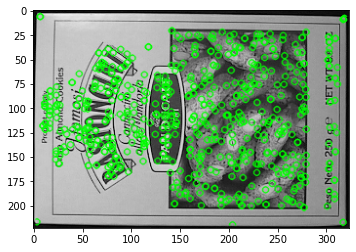

In [6]:
plt.imshow(cv2.drawKeypoints(image1,kp1,None,color=(0,255,0)))

Take an image and a pixel location (15,15).
Take the window size of 3,3 such that the pixel is located at the center of the window size.
Now form a vector of 9 values which are just the intensities in that window.

In [7]:
window_size = (3,3)
a, b = window_size
x, y = 15,15 # Initial location
image1=cv2.imread('drive/My Drive/CVIT Day 4/Feature Matching/box.png',cv2.IMREAD_GRAYSCALE)
image1[x - 1: x + a -1, y - 1: y + b -1].ravel()

array([196, 195, 198, 196, 196, 199, 197, 196, 198], dtype=uint8)

Text(0.5, 0, '(b)')

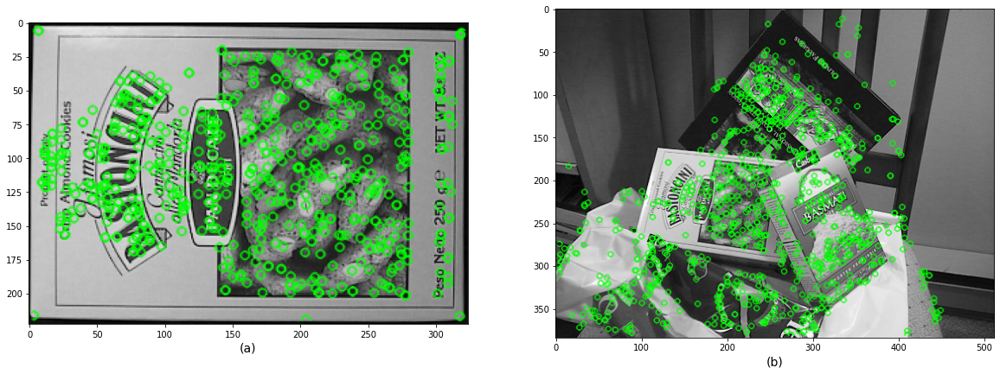

In [8]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(image1,kp1,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(image2,kp2,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

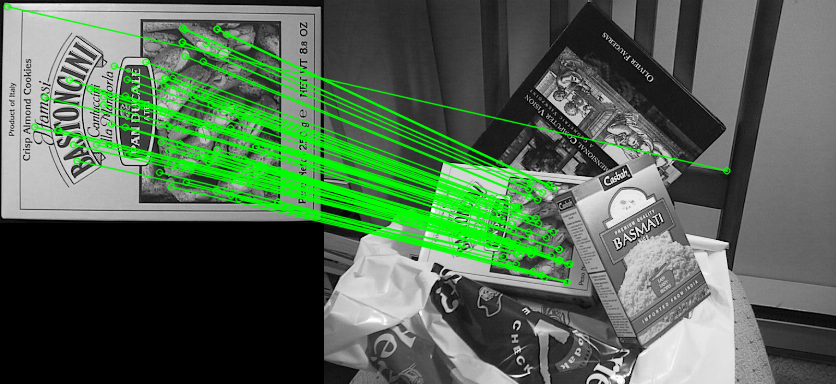

In [9]:
match = cv2.BFMatcher()
matches = match.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

draw_params = dict(matchColor=(0,255,0),
                       singlePointColor=None,
                       flags=2)

img3 = cv2.drawMatches(image1,kp1,image2,kp2,good,None,**draw_params)
cv2_imshow(img3)

## Panorama : Taj Mahal Example

In [0]:
image1=cv2.imread('drive/My Drive/CVIT Day 4/Panorama/Eg1/img2_2.png')
image2=cv2.imread('drive/My Drive/CVIT Day 4/Panorama/Eg1/img2_1.png')

image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

In [0]:
# # find the keypoints and descriptors with ORB
# kp1, des1 = orb.detectAndCompute(image1_gray,None)
# kp2, des2 = orb.detectAndCompute(image2_gray,None)

In [0]:
# Initiate Sift detector
sift =cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1_gray,None)
kp2, des2 = sift.detectAndCompute(image2_gray,None)

Text(0.5, 0, '(b)')

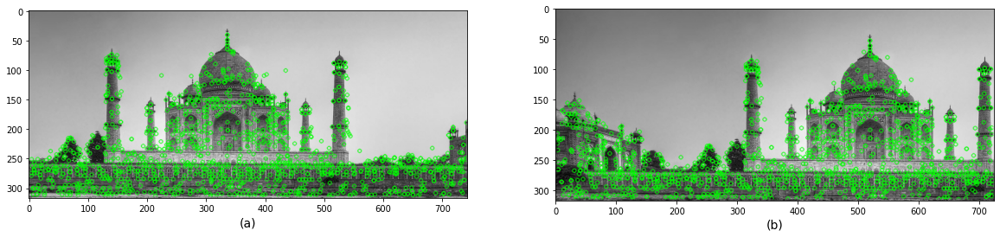

In [13]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(image1_gray,kp1,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(image2_gray,kp2,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

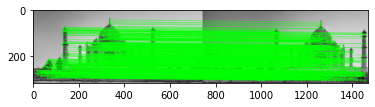

In [14]:
match = cv2.BFMatcher()
matches = match.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.03*n.distance:
        good.append(m)

draw_params = dict(matchColor=(0,255,0),
                       singlePointColor=None,
                       flags=2)

img3 = cv2.drawMatches(image1_gray,kp1,image2_gray,kp2,good,None,**draw_params)
plt.imshow(img3)

In [0]:
MIN_MATCH_COUNT = 10
if len(good) > MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    h,w = image2_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts, M)
    #img2 = cv2.polylines(image2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

    #plt.imshow(img2)
else:
    print("Not enought matches are found - %d/%d", (len(good)/MIN_MATCH_COUNT))

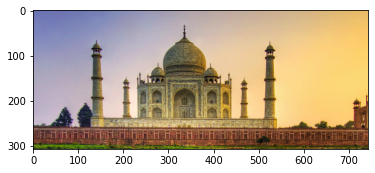

In [16]:
dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]))
# dst[0:image2.shape[0],0:image2.shape[1]] = image2
# plt.imshow(dst)
def trim(frame):
    #crop top
    if not np.sum(frame[0]):
        return trim(frame[1:])
    #crop bottom
    if not np.sum(frame[-1]):
        return trim(frame[:-2])
    #crop left
    if not np.sum(frame[:,0]):
        return trim(frame[:,1:])
    #crop right
    if not np.sum(frame[:,-1]):
        return trim(frame[:,:-2])
    return frame

plt.imshow(trim(dst))

## Panorama : Letters example (Demo to show trivial solution will fail)

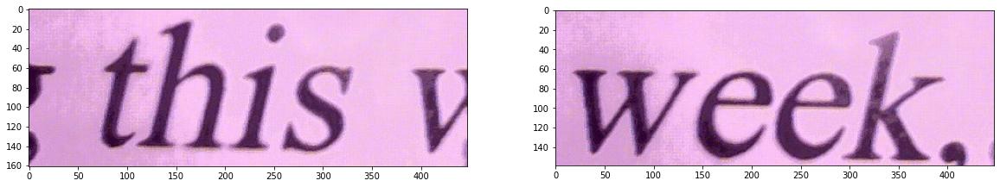

In [17]:
image1=cv2.imread('/content/drive/My Drive/CVIT Day 4/Panorama/Eg3/img4_1.jpg')
image2=cv2.imread('/content/drive/My Drive/CVIT Day 4/Panorama/Eg3/img4_2.jpg')

image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)

In [0]:
# # find the keypoints and descriptors with ORB
# kp1, des1 = orb.detectAndCompute(image1_gray,None)
# kp2, des2 = orb.detectAndCompute(image2_gray,None)

In [0]:
# Initiate Sift detector
sift =cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1_gray,None)
kp2, des2 = sift.detectAndCompute(image2_gray,None)

Text(0.5, 0, '(b)')

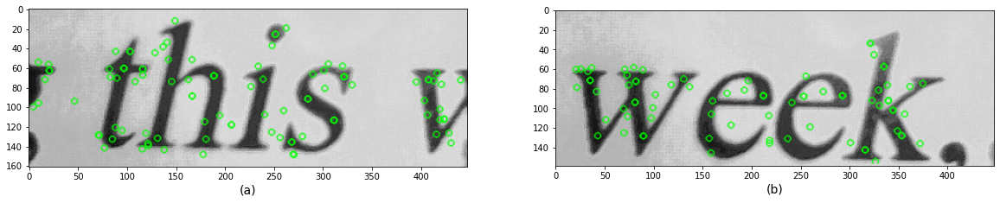

In [20]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(image1_gray,kp1,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(image2_gray,kp2,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

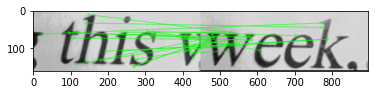

In [21]:
match = cv2.BFMatcher()
matches = match.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.8*n.distance: #Increasing this threshold to force some image generation
        good.append(m)

draw_params = dict(matchColor=(0,255,0),
                       singlePointColor=None,
                       flags=2)

img3 = cv2.drawMatches(image1_gray,kp1,image2_gray,kp2,good,None,**draw_params)
plt.imshow(img3)

In [0]:
#reducing this to 4 to force some image generation 
MIN_MATCH_COUNT = 4

if len(good) > MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    h,w = image2_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts, M)
    #img2 = cv2.polylines(image2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

    #plt.imshow(img2)
else:
    print("Not enought matches are found - %d/%d", (len(good)/MIN_MATCH_COUNT))

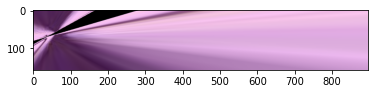

In [23]:
dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]))
# dst[0:image2.shape[0],0:image2.shape[1]] = image2
# plt.imshow(dst)
def trim(frame):
    #crop top
    if not np.sum(frame[0]):
        return trim(frame[1:])
    #crop bottom
    if not np.sum(frame[-1]):
        return trim(frame[:-2])
    #crop left
    if not np.sum(frame[:,0]):
        return trim(frame[:,1:])
    #crop right
    if not np.sum(frame[:,-1]):
        return trim(frame[:,:-2])
    return frame

plt.imshow(trim(dst))

## Panorama as a function for dealing with multiple images

In [0]:
def trim(frame):
          #crop top
          if not np.sum(frame[0]):
              return trim(frame[1:])
          #crop bottom
          if not np.sum(frame[-1]):
              return trim(frame[:-2])
          #crop left
          if not np.sum(frame[:,0]):
              return trim(frame[:,1:])
          #crop right
          if not np.sum(frame[:,-1]):
              return trim(frame[:,:-2])
          return frame

def panorama(path_right,path_left,thresh = 0.03, c = 10, trim_flag = True):

      image1=cv2.imread(path_right)
      image2=cv2.imread(path_left)

      image1_gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
      image2_gray=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

      image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
      image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

      # Initiate Sift detector
      sift =cv2.xfeatures2d.SIFT_create()
      kp1, des1 = sift.detectAndCompute(image1_gray,None)
      kp2, des2 = sift.detectAndCompute(image2_gray,None)

      # display the keypoints and features detected on both images
      fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
      ax1.imshow(cv2.drawKeypoints(image1_gray,kp1,None,color=(0,255,0)))
      #ax1.set_xlabel("(a)", fontsize=14)
      ax2.imshow(cv2.drawKeypoints(image2_gray,kp2,None,color=(0,255,0)))
      #ax2.set_xlabel("(b)", fontsize=14)

      match = cv2.BFMatcher()
      matches = match.knnMatch(des1,des2,k=2)

      good = []
      for m,n in matches:
          if m.distance < thresh*n.distance:
              good.append(m)

      draw_params = dict(matchColor=(0,255,0),
                            singlePointColor=None,
                            flags=2)

      img3 = cv2.drawMatches(image1_gray,kp1,image2_gray,kp2,good,None,**draw_params)
      ax3.imshow(img3)

      MIN_MATCH_COUNT = c
      if len(good) > MIN_MATCH_COUNT:
          src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
          dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

          M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

          h,w = image2_gray.shape
          pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
          dst = cv2.perspectiveTransform(pts, M)
          #img2 = cv2.polylines(image2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

          #plt.imshow(img2)
      else:
          print("Not enought matches are found - %d/%d", (len(good)/MIN_MATCH_COUNT))

      dst = cv2.warpPerspective(image1,M,(image2.shape[1] + image1.shape[1], image2.shape[0]+ image1.shape[0]))
      dst[0:image2.shape[0],0:image2.shape[1]] = image2
      #plt.imshow(dst)

      
      #plt.imshow(trim(dst))
      #cv2.imsave("original_image_stitched_crop.jpg", trim(dst))
      return (trim(dst)) if trim_flag else dst

#Homework

GTA Online Image 1: On the road. This image has given a perfect output. Straight line dividing the road can be observed, windows can be counted. This is achieved due to high resolution and good contrast.

GTA Online Image 2 and HomeWall Image: These images are complete failiures through the naive approach. Due to a very poor intensity gradient it is not possible to extract meaningful features in sufficient quantity.

Darkroom and Tubelight Image: Same as above. Aditionally, these images are VERY LOW CONTRAST. For this reason, although we find features by eye but they are not well mapped by SIFT as poor intesnity gradient makes edge/corner detection hard. I believe a Gamma Filter WILL help hugely, but objective of this study is to find strengths and weaknesses of naive approach to Panorama.

GTA Online Image 3: Sunlight. This image has a sort of line dividing it as both sides have slightly different lighting. Can be easily fixed by a gamma filter. This is obviously much higher resolution than the tubelight image, but key point is the light source does not spill over the image to such an extent that the contrast of it is ruined. Therefore, feature extraction is performed well and it is very nice to see how neatly the trees have curved to the right!

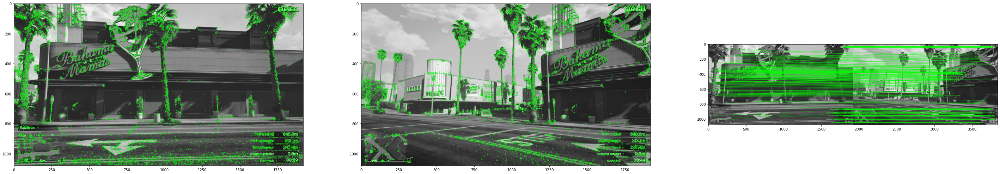

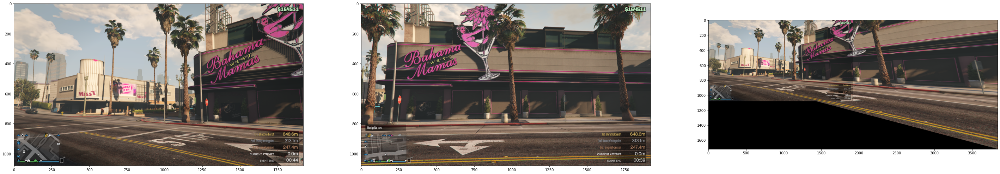

In [33]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/GTA_OnlinePan1right.png'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/GTA_OnlinePan1left.png'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.5)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)

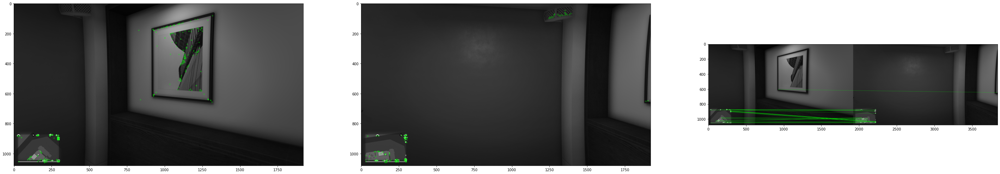

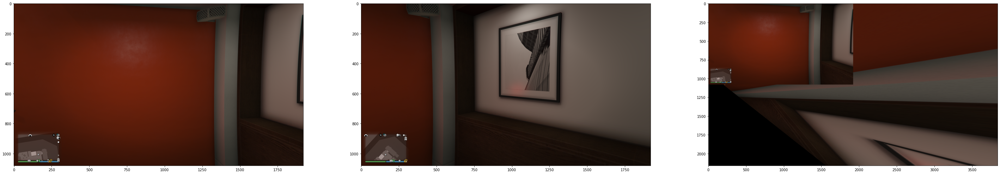

In [34]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/wall_right.png'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/wall_left.png'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.5)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)

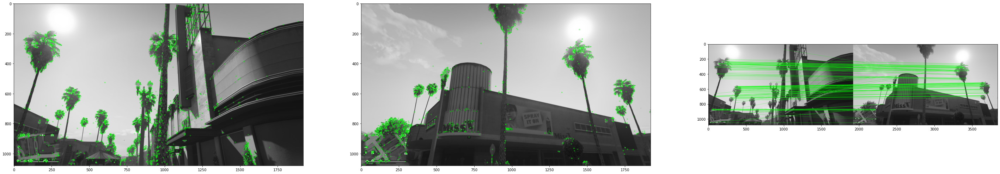

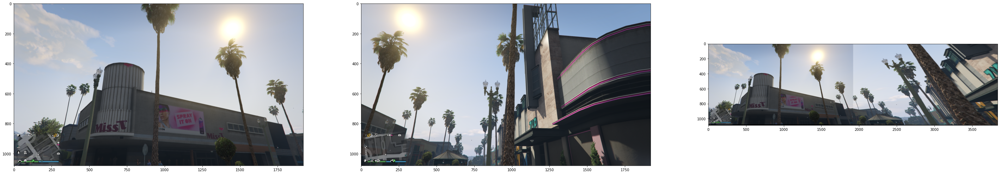

In [35]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/sun_right.png'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/sun_left.png'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.5)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)

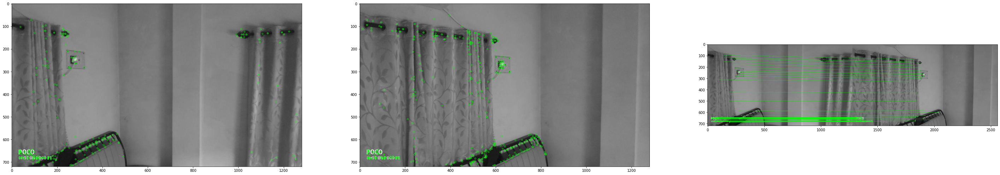

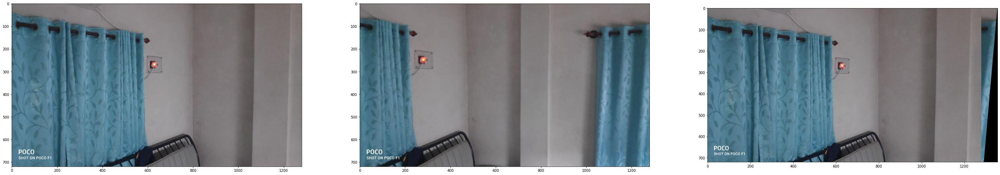

In [36]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/homewall_right.jpg'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/homewall_left.jpg'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.5)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)

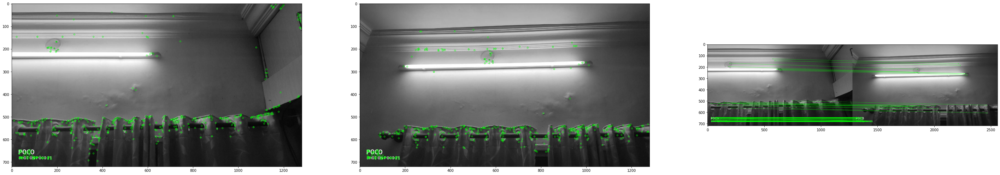

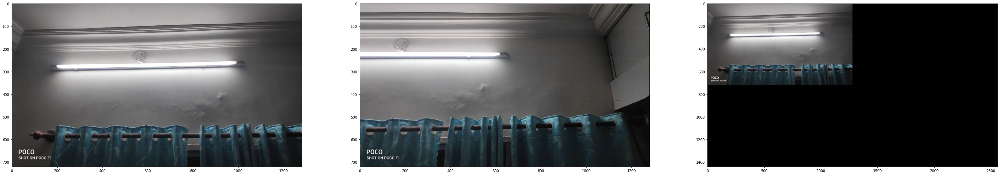

In [38]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/tubelight_right.jpg'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/tubelight_left.jpg'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.5, trim_flag=False)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)

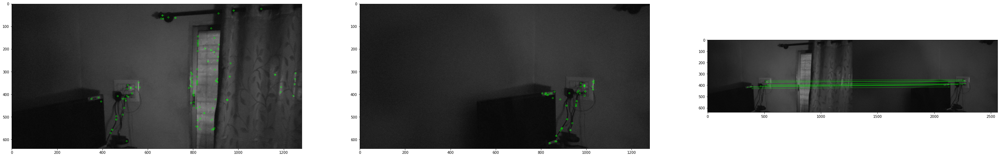

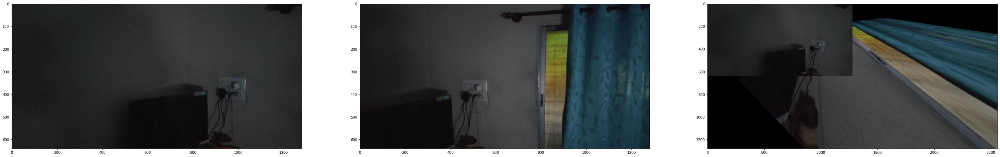

In [40]:
path_right = '/content/drive/My Drive/my_test_images/Pan_testing/darkroom_right.jpg'
path_left = '/content/drive/My Drive/my_test_images/Pan_testing/darkroom_left.jpg'

image1=cv2.imread(path_left)
image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2=cv2.imread(path_right)
image2=cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

pan_img = panorama(path_right, path_left, 0.7, trim_flag = False)

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(50,100), constrained_layout=False)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(pan_img)